# INTENTO POR HACER UN BUEN OPTIMIZADOR DEL 4 BARRAS

## LIBRERIAS

In [159]:
import numpy as np
from numpy import deg2rad, rad2deg
import matplotlib.pyplot as plt
from sympy import symbols, solve, lambdify
from sympy.physics.mechanics import dynamicsymbols, ReferenceFrame, init_vprinting
from scipy.optimize import fsolve, minimize, differential_evolution
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## CINEMATICA

In [160]:

import sympy


L1,L2,L3 = symbols('L1 L2 L3')
L4x, L4y = symbols('L4x L4y')
L5_tangent, L5_normal = symbols('L5_t L5_n')
theta, beta1, beta2 = dynamicsymbols('theta beta_1 beta_2')

L5t = 0.05
L5n = 0.02

#Marcos de referencia
N = ReferenceFrame('N')
A = N.orientnew('A', 'Axis', [theta, N.z])
B = A.orientnew('B', 'Axis', [beta1, A.z])
C = B.orientnew('C', 'Axis', [beta2, B.z])

r1 = L1 * A.x
r2 = L2 * B.x
r3 = L3 * C.x
r4 = L4x * N.x + L4y * N.y
r5 = L5_tangent * B.x + L5_normal * B.y
kinematic_loop = r1 + r2 + r3 - r4 #= 0

S_position = r1 + r5  # posición de S en términos de los marcos y parámetros
Seq1 = S_position.dot(N.x)
Seq2 = S_position.dot(N.y)
Seqs = [Seq1, Seq2]

lambdifier_S_position = lambdify((theta, beta1, beta2, L1, L2, L3, L4x, L4y, L5_tangent, L5_normal), Seqs)


eq1 = kinematic_loop.dot(N.x)
eq2 = kinematic_loop.dot(N.y)
eqs = [eq1, eq2]

lambdifier_kinematic_eqs = lambdify((beta1, beta2, theta, L1, L2, L3, L4x, L4y), eqs)

def FK(theta1, z0, L1, L2, L3, L4x, L4y):
    sol, info, ier, _ = fsolve(lambda b: lambdifier_kinematic_eqs(b[0], b[1], theta1, L1, L2, L3, L4x, L4y), z0, full_output=True)
    residual = float(np.linalg.norm(info['fvec']))
    return sol, residual


def anglelist_generator(theta1_list, L1, L2, L3, L4x, L4y):
    angle_list = []
    for i in range(len(theta1_list)):
        theta1 = theta1_list[i]
        if i == 0:
            z0 = [deg2rad(50), deg2rad(0)]  # Estimación inicial para el primer ángulo
        else:
            z0 = angle_list[-1][1:]  # Usar la solución anterior como estimación inicial
        sol, residual = FK(theta1, z0, L1, L2, L3, L4x, L4y)
        if residual < 1e-6:
            angle_list.append([theta1, sol[0], sol[1]])
        else:
            print(f"Warning: No solution found for theta={theta1} (residual={residual})")
    return np.array(angle_list)






OA = r1
AB = r1 + r2
BC = r1 + r2 + r3
BC_prime =  r4
points_fun=[sympy.lambdify([theta, beta1, beta2, L1, L2, L3, L4x, L4y], [point.dot(N.x), point.dot(N.y)]) for point in [OA, AB, BC, BC_prime]]


def plot4bar(ax, theta, beta1, beta2, L1, L2, L3, L4x, L4y):
    PO = np.array([0, 0])
    PA = points_fun[0](theta, beta1, beta2, L1, L2, L3, L4x, L4y)
    PB = points_fun[1](theta, beta1, beta2, L1, L2, L3, L4x, L4y)
    PC = points_fun[2](theta, beta1, beta2, L1, L2, L3, L4x, L4y)
    PC_prime = points_fun[3](theta, beta1, beta2, L1, L2, L3, L4x, L4y)
    ax.plot([PO[0], PA[0]], [PO[1], PA[1]], 'b-')
    ax.plot(PO[0], PO[1], 'ko')
    ax.plot([PA[0], PB[0]], [PA[1], PB[1]], 'g-')
    ax.plot(PA[0], PA[1], 'ko')
    ax.plot([PB[0], PC[0]], [PB[1], PC[1]], 'r-')
    ax.plot(PB[0], PB[1], 'ko')
    ax.plot([PC[0], PC_prime[0]], [PC[1], PC_prime[1]], 'k--')
    ax.plot(PC[0], PC[1], 'ko')
    # ax.set_xlim(-0.3, 0.2)
    # ax.set_ylim(-0.2, 0.2)
    ax.grid(True)


# def update_fun(i):
#     ax.cla()                  
#     ax.set_aspect('equal')    
#     plot4bar(ax, thetasList[i, :])

# anim = FuncAnimation(fig, update_fun, len(thetasList), repeat=False)
# HTML(anim.to_jshtml())

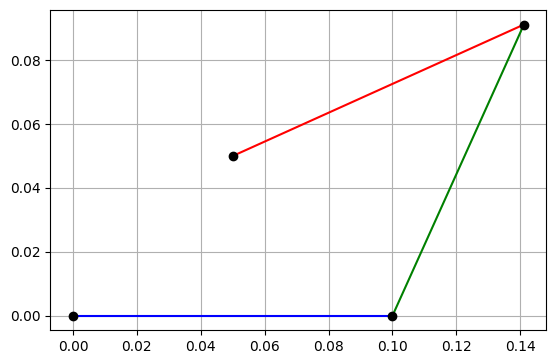

In [161]:
thetatest = np.linspace(0, 2*np.pi, 100)
L1test, L2test, L3test, L4xtest, L4ytest = 0.1, 0.1, 0.1, 0.05, 0.05
angletest_list = anglelist_generator(thetatest, L1test, L2test, L3test, L4xtest, L4ytest)


fig, ax = plt.subplots()

def update_fun(i):
    ax.cla()                  
    ax.set_aspect('equal')
    theta_plot, beta1_plot, beta2_plot = angletest_list[i, :]  
    plot4bar(ax, theta_plot, beta1_plot, beta2_plot, L1test, L2test, L3test, L4xtest, L4ytest)

anim = FuncAnimation(fig, update_fun, len(angletest_list), repeat=False)
HTML(anim.to_jshtml())

## CINEMATICA INVERSA

In [162]:
#Defino una función de error para minimizar la distancia entre el punto S calculado y el punto deseado
def IK_error_function(obj_fun, target_pos, theta_val,z0, l1, l2, l3, l4x, l4y):
    beta1, beta2 = FK(theta_val, z0, l1, l2, l3, l4x, l4y)[0]
    S_pos = lambdifier_S_position(theta_val, beta1, beta2, l1, l2, l3, l4x, l4y, L5t, L5n)
    dx = S_pos[0] - target_pos[0]
    dy = S_pos[1] - target_pos[1]
    D = 100*np.sqrt(dx**2 + dy**2) #*100 para hacer que minimize trabaje más
    error = D
    return error

def IK(thetaig, minimizer_function):
    sol = minimize(minimizer_function, thetaig)
    return sol.x

def IK_on_trayectory(Spoints, anglesig, l1, l2, l3, l4x, l4y):
    theta_iteration_sols = []
    betas_iteration_sols = []
    angles = []
    n = len(Spoints)
    for i in range(n):
        coordenada = Spoints[i]
        if i == 0:
            thetaig = anglesig[i, 0]
            z0 = FK(thetaig, anglesig[i, 1:], l1, l2, l3, l4x, l4y)[0]
        else:
            thetaig = theta_iteration_sols[-1]
            z0 = betas_iteration_sols[-1]
        
        myerrorfun = lambda x: IK_error_function(lambdifier_kinematic_eqs, coordenada, x[0], z0, l1, l2, l3, l4x, l4y)

        sol = IK([thetaig], myerrorfun)
        theta_sol = sol[0]
        beta1_sol, beta2_sol = FK(theta_sol, z0, l1, l2, l3, l4x, l4y)[0]

        theta_iteration_sols.append(theta_sol)
        betas_iteration_sols.append((beta1_sol, beta2_sol))
        angles.append([theta_sol, beta1_sol, beta2_sol])
    

    return angles

In [163]:
Sx, Sy = lambdifier_S_position(
    angletest_list[:, 0],
    angletest_list[:, 1],
    angletest_list[:, 2],
    L1test, L2test, L3test, L4xtest, L4ytest, L5t, L5n
)
Stest = np.column_stack((np.asarray(Sx), np.asarray(Sy)))
IK_test_findedangles = IK_on_trayectory(Stest, angletest_list, L1test, L2test, L3test, L4xtest, L4ytest)


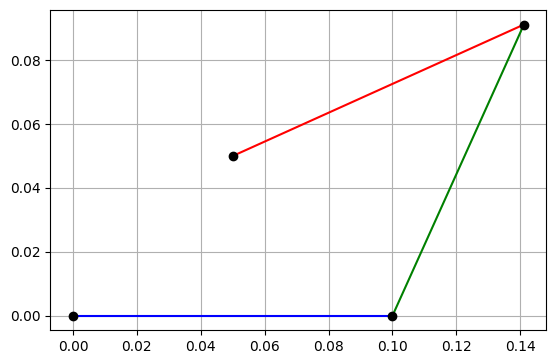

In [164]:
"""
PRUEBA DE FUNCIONAMIENTO DE IK:
    Resultado debe ser IGUAL al graficado previamente
"""

fig, ax = plt.subplots()

def update_fun(i):
    ax.cla()                  
    ax.set_aspect('equal')
    theta_plot = IK_test_findedangles[i][0]
    beta1_plot = IK_test_findedangles[i][1]
    beta2_plot = IK_test_findedangles[i][2]
    plot4bar(ax, theta_plot, beta1_plot, beta2_plot, L1test, L2test, L3test, L4xtest, L4ytest)

anim = FuncAnimation(fig, update_fun, len(IK_test_findedangles), repeat=False)
HTML(anim.to_jshtml())

## TRAYECTORIA

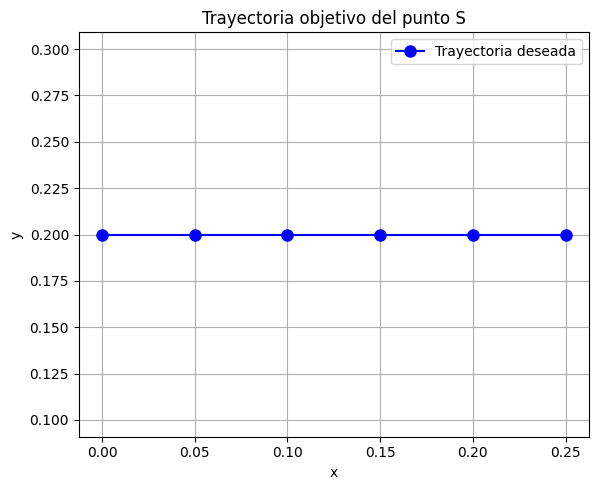

Número de puntos objetivo: 6


In [165]:
# ============================================================
# TRAYECTORIA DESEADA
# ============================================================
#Ejemplo 1: Línea horizontal
SList = np.array([
    [ 0.15+0.10,  0.20],
    [ 0.10+0.10,  0.20],
    [ 0.05+0.10,  0.20],
    [ 0.00+0.10,  0.20],
    [-0.05+0.10,  0.20],
    [-0.10+0.10,  0.20],
])

# # Ejemplo 2: Arco de círculo
# angles_arc = np.linspace(deg2rad(30), deg2rad(150), 8)
# R_arc = 0.15
# SList = np.column_stack([R_arc * np.cos(angles_arc), R_arc * np.sin(angles_arc) + 0.10])

# # Ejemplo 3: Línea inclinada
# # SList = np.array([
# #     [0.10, 0.10],
# #     [0.05, 0.13],
# #     [0.00, 0.16],
# #     [-0.05, 0.19],
# #     [-0.10, 0.22],
# # ])


# El ángulo theta1 se distribuye uniformemente para los N puntos objetivo
"""LISTA DE ITERACIÓN PARA THETA1"""
theta_opt_list = np.linspace(0, 2*np.pi, len(SList), endpoint=False)

# Visualizar trayectoria deseada
plt.figure(figsize=(6, 5))
plt.plot(SList[:, 0], SList[:, 1], 'bo-', markersize=8, label='Trayectoria deseada')
# for i, (x, y) in enumerate(SList):
#     plt.annotate(f'S{i}', (x*1000, y*1000), textcoords='offset points', xytext=(5, 5))
plt.xlabel('x')
plt.ylabel('y')
plt.title('Trayectoria objetivo del punto S')
plt.legend()
plt.axis('equal')
plt.grid(True)
plt.tight_layout()
plt.show()
print(f"Número de puntos objetivo: {len(SList)}")

## COSTO

In [166]:
def cost_IK(x, SList):
    L1, L2, L3, L4x, L4y = x

    if L1 <= 0 or L2 <= 0 or L3 <= 0:
        return 1e6

    # Estimación inicial: usar anglelist_generator con theta uniforme
    # solo para tener un anglesig de partida para IK
    theta_ig_list = np.linspace(0, 2*np.pi, len(SList), endpoint=False)
    try:
        anglesig = anglelist_generator(theta_ig_list, L1, L2, L3, L4x, L4y)
    except Exception:
        return 1e6

    if len(anglesig) < len(SList):
        return 1e6

    # IK encuentra el theta1 exacto que minimiza distancia a cada S_obj[i]
    angles = IK_on_trayectory(SList, anglesig, L1, L2, L3, L4x, L4y)

    total_error = 0.0
    for i, row in enumerate(angles):
        theta_sol, b1, b2 = row
        S_calc = lambdifier_S_position(theta_sol, b1, b2,
                                       L1, L2, L3, L4x, L4y, L5t, L5n)
        total_error += (S_calc[0] - SList[i][0])**2 + (S_calc[1] - SList[i][1])**2

    return total_error

def cost_wrapper_IK(x):
    return cost_IK(x, SList)

In [167]:
# ============================================================
# FUNCIÓN DE COSTO
# ============================================================

def cost(x, SList, theta_list, z0_init=None, penalty=1e3):
    """
    Función de costo para optimización del mecanismo 4 barras.
    
    Minimiza la suma del error cuadrático entre la trayectoria
    generada por S y la trayectoria deseada SList.
    
    Parámetros
    ----------
    x        : array [L1, L2, L3, L4x, L4y] - variables de diseño (m)
    SList    : array (N, 2) - trayectoria deseada
    theta_list: array (N,)  - ángulos de entrada correspondientes
    z0_init  : lista [beta1, beta2] estimación inicial (rad)
    penalty  : float - penalización por no convergencia
    
    Retorna
    -------
    float : error total
    """
    L1, L2, L3, L4x, L4y = x
    
    # Penalizar parámetros físicamente imposibles
    if L1 <= 0 or L2 <= 0 or L3 <= 0:
        return 1e6
    
    if z0_init is None:
        z0 = [deg2rad(90), deg2rad(0)]
    else:
        z0 = list(z0_init)
    
    total_error = 0.0
    
    for i, theta1 in enumerate(theta_list):
        z, res = FK(theta1, z0, L1, L2, L3, L4x, L4y)
        
        if res > 1e-5:
            # FK no convergió: penalizar fuertemente
            total_error += penalty
            continue
        
        # CORRECTO: usar z (solución actual) como estimación para el siguiente paso
        z0 = z.tolist()
        
        # Calcular posición de S y error respecto al objetivo
        Spos = lambdifier_S_position(theta1, z[0], z[1], L1, L2, L3, L4x, L4y, L5t, L5n)
        total_error += np.sum((Spos - SList[i])**2)
    
    return total_error


def cost_wrapper(x):
    return cost(x, SList, theta_opt_list)


print("Función de costo definida.")

# Verificar costo con dimensiones de referencia
x_ref = [L1test, L2test, L3test, L4xtest, L4ytest]
print(f"Costo con dimensiones de referencia: {cost_wrapper(x_ref):.6f}")

Función de costo definida.
Costo con dimensiones de referencia: 0.343842


## OPTIMIZACIÓN

In [168]:
# ============================================================
# LÍMITES Y ESTIMACIÓN INICIAL
# ============================================================
# [L1, L2, L3, L4x, L4y] en metros
bounds = [
    (0.01, 0.4),   # L1: manivela
    (0.01, 0.4),   # L2: acoplador
    (0.01, 0.4),   # L3: seguidor
    (-0.05, 0.05),  # L4x: componente x de la barra fija
    (-0.05, 0.05),  # L4y: componente y de la barra fija
]

# Estimación inicial (puede ajustarse)
x0 = [L1test, L2test, L3test, L4xtest, L4ytest]

print(f"Estimación inicial: L1={x0[0]:.0f}, L2={x0[1]:.0f}, "
      f"L3={x0[2]:.0f}, L4x={x0[3]:.0f}, L4y={x0[4]:.0f}")
print(f"Costo inicial: {cost_wrapper(x0):.6f}")

Estimación inicial: L1=0, L2=0, L3=0, L4x=0, L4y=0
Costo inicial: 0.343842


In [169]:
import time

# 1. ¿Cuánto tarda UNA evaluación de FK?
t = time.time()
z, res = FK(0.1, [deg2rad(120), deg2rad(-80)], 0.08, 0.24, 0.20, 0.19, 0.07)
t_fk = time.time() - t
print(f"FK: {t_fk*1000:.3f} ms  (residual={res:.2e})")

# 2. ¿Cuánto tarda UNA evaluación de cost()?
t = time.time()
c = cost_wrapper([0.08, 0.24, 0.20, 0.19, 0.07])
t_cost = time.time() - t
print(f"cost(): {t_cost*1000:.1f} ms  (valor={c:.6f})")


FK: 0.313 ms  (residual=2.01e-13)
cost(): 1.0 ms  (valor=0.346786)


In [170]:
# ============================================================
# OPTIMIZACIÓN EN DOS FASES
# ============================================================
# Fase 1: Evolución diferencial (búsqueda global, más lenta pero robusta)
# Fase 2: Nelder-Mead o L-BFGS-B para refinamiento local

print("Fase 1: Optimización global (Evolución Diferencial)...")
print("(Esto puede tomar unos segundos)")

result_global = differential_evolution(
    cost_wrapper,
    bounds=bounds,
    seed=42,
    maxiter=3000,
    tol=1e-8,
    popsize=10,
    mutation=(0.5, 1.5),
    recombination=0.7,
    workers=1,
    disp=True,
)

print(f"  Resultado fase 1: {result_global.message}")
print(f"  Costo fase 1:     {result_global.fun:.6f}")

# print("\nFase 2: Refinamiento local (Nelder-Mead)...")
# result_local = minimize(
#     cost_wrapper,
#     result_global.x,
#     method='Nelder-Mead',
#     options={'maxiter': 10000, 'xatol': 1e-8, 'fatol': 1e-10, 'adaptive': True},
# )

# print(f"  Resultado fase 2: {result_local.message}")
# print(f"  Costo fase 2:     {result_local.fun:.6f}")

# # Tomar el mejor resultado
# if result_local.fun < result_global.fun:
#     result_best = result_local
# else:
#     result_best = result_global

result_best = result_global  # Solo fase 1 por ahora

L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt = result_best.x

print("\n" + "="*50)
print("PARÁMETROS ÓPTIMOS ENCONTRADOS:")
print("="*50)
print(f"  L1  (manivela)  = {L1_opt:.2f}")
print(f"  L2  (acoplador) = {L2_opt:.2f}")
print(f"  L3  (seguidor)  = {L3_opt:.2f}")
print(f"  L4x (fijo x)    = {L4x_opt:.2f}")
print(f"  L4y (fijo y)    = {L4y_opt:.2f}")
print(f"  C está en       = ({-L4x_opt:.1f}, {-L4y_opt:.1f}) relativo a O")
print(f"  Error RMS total = {np.sqrt(result_best.fun/len(SList)):.3f}")



Fase 1: Optimización global (Evolución Diferencial)...
(Esto puede tomar unos segundos)
differential_evolution step 1: f(x)= 0.3631457608417244
differential_evolution step 2: f(x)= 0.3631457608417244
differential_evolution step 3: f(x)= 0.3631457608417244
differential_evolution step 4: f(x)= 0.3061148681762146
differential_evolution step 5: f(x)= 0.3061148681762146
differential_evolution step 6: f(x)= 0.3061148681762146
differential_evolution step 7: f(x)= 0.3061148681762146
differential_evolution step 8: f(x)= 0.23666639600995126
differential_evolution step 9: f(x)= 0.23666639600995126
differential_evolution step 10: f(x)= 0.23666639600995126
differential_evolution step 11: f(x)= 0.23666639600995126
differential_evolution step 12: f(x)= 0.23666639600995126
differential_evolution step 13: f(x)= 0.23666639600995126
differential_evolution step 14: f(x)= 0.23666639600995126
differential_evolution step 15: f(x)= 0.23666639600995126
differential_evolution step 16: f(x)= 0.23666639600995126


In [171]:
import time

# 1. Tiempo de una evaluación de cost FK (ya lo tienes medido)
t = time.time()
cost_wrapper([L1test, L2test, L3test, L4xtest, L4ytest])
t_fk = time.time() - t
print(f"cost FK:  {t_fk*1000:.1f} ms")

# 2. Tiempo de una evaluación de cost IK
t = time.time()
cost_wrapper_IK([L1test, L2test, L3test, L4xtest, L4ytest])
t_ik = time.time() - t
print(f"cost IK:  {t_ik*1000:.1f} ms")

# 3. Proyección de tiempos totales
n_vars    = 5
pop_fk    = 8
pop_ik    = 8   # Nelder-Mead no tiene población, usa ~(n+1)=6 evaluaciones por paso

iter_fase1 = 500
iter_fase2 = 2000

evals_fase1 = iter_fase1 * pop_fk * n_vars        # estimación DE
evals_fase2 = iter_fase2 * (n_vars + 1)           # estimación Nelder-Mead

t_fase1 = evals_fase1 * t_fk
t_fase2 = evals_fase2 * t_ik

print(f"\nFase 1 (~{evals_fase1:,} evals FK):  {t_fase1:.0f} s  ({t_fase1/60:.1f} min)")
print(f"Fase 2 (~{evals_fase2:,} evals IK):  {t_fase2:.0f} s  ({t_fase2/60:.1f} min)")
print(f"Total estimado:                    {(t_fase1+t_fase2)/60:.1f} min")

cost FK:  1.0 ms
cost IK:  13.8 ms

Fase 1 (~20,000 evals FK):  20 s  (0.3 min)
Fase 2 (~12,000 evals IK):  166 s  (2.8 min)
Total estimado:                    3.1 min


## EVALUACION

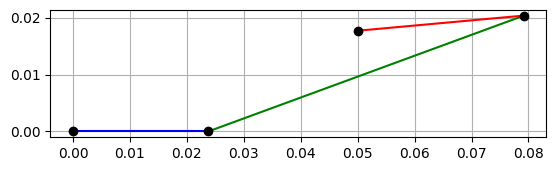

In [172]:
# ============================================================
# SIMULAR MECANISMO ÓPTIMO (ciclo completo)
# ============================================================
N_sim = 200  # puntos para animación suave
theta_sim = np.linspace(0, 2*np.pi, N_sim, endpoint=False)
anglelist_sim = anglelist_generator(theta_sim, L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt)


fig, ax = plt.subplots()

def update_fun(i):
    ax.cla()                  
    ax.set_aspect('equal')
    theta_plot, beta1_plot, beta2_plot = anglelist_sim[i, :]  
    plot4bar(ax, theta_plot, beta1_plot, beta2_plot, L1_opt, L2_opt, L3_opt, L4x_opt, L4y_opt)

anim = FuncAnimation(fig, update_fun, len(anglelist_sim), repeat=False)
HTML(anim.to_jshtml())
